In [28]:
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential, Model
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras import backend as K
from keras import optimizers
#from keras import callbacks
#from losswise.libs import LosswiseKerasCallback
#import losswise
import numpy as np
import glob as glob

#losswise.set_api_key("9307ldi")

In [234]:
# dimensions of our images.
img_width, img_height = 256, 256

train_data_dir = '../data/model/key18/train'
validation_data_dir = '../data/model/key18/validation'
nb_train_samples = int(len(glob.glob(train_data_dir+'/*/*.png')))
nb_validation_samples = int(len(glob.glob(validation_data_dir+'/*/*.png')))
epochs = 50
batch_size = 16

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)

In [235]:
model = Sequential()
model.add(Conv2D(64, (3, 3), input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(3, 3)))
# model.add(Dropout(0.5))


model.add(Conv2D(34, (5, 5)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(3, 3)))
model.add(Dropout(0.5))

model.add(Conv2D(34, (8, 8)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(3, 3)))
model.add(Dropout(0.5))


model.add(Flatten())
model.add(Dense(256))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(6))
model.add(Activation('softmax'))

AdamOpt = optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)
model.compile(loss='categorical_crossentropy',
              optimizer=AdamOpt,
              metrics=['accuracy'])

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_7 (Conv2D)            (None, 254, 254, 64)      1792      
_________________________________________________________________
activation_11 (Activation)   (None, 254, 254, 64)      0         
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 84, 84, 64)        0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 80, 80, 34)        54434     
_________________________________________________________________
activation_12 (Activation)   (None, 80, 80, 34)        0         
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 26, 26, 34)        0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 26, 26, 34)        0         
__________

In [31]:
train_datagen = ImageDataGenerator(rescale=1. / 255)

validation_datagen = ImageDataGenerator(rescale=1. / 255)

test_datagen = ImageDataGenerator(rescale=1. / 255)

In [32]:
train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

Found 4828 images belonging to 6 classes.


In [33]:
validation_generator = validation_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    shuffle = False,
    class_mode='categorical')

Found 2070 images belonging to 6 classes.


In [17]:
model.fit_generator(
    train_generator,
    steps_per_epoch=nb_train_samples // batch_size,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=nb_validation_samples // batch_size, verbose=1)

Epoch 1/50
301/301 [==============================] - 35s - loss: 1.4667 - acc: 0.3522 - val_loss: 1.3499 - val_acc: 0.4530
Epoch 2/50
301/301 [==============================] - 30s - loss: 1.2094 - acc: 0.4736 - val_loss: 1.2092 - val_acc: 0.4596
Epoch 3/50
301/301 [==============================] - 29s - loss: 1.0570 - acc: 0.5384 - val_loss: 1.0961 - val_acc: 0.6008
Epoch 4/50
301/301 [==============================] - 29s - loss: 0.9108 - acc: 0.6175 - val_loss: 0.8689 - val_acc: 0.7167
Epoch 5/50
301/301 [==============================] - 29s - loss: 0.7795 - acc: 0.6887 - val_loss: 0.7745 - val_acc: 0.7697
Epoch 6/50
301/301 [==============================] - 29s - loss: 0.6635 - acc: 0.7425 - val_loss: 0.6089 - val_acc: 0.8208
Epoch 7/50
301/301 [==============================] - 29s - loss: 0.5687 - acc: 0.7745 - val_loss: 0.4499 - val_acc: 0.8603
Epoch 8/50
301/301 [==============================] - 29s - loss: 0.5413 - acc: 0.7857 - val_loss: 0.4445 - val_acc: 0.8432
Epoch 9/

In [34]:
model.load_weights('../saved_weights/CNN_key18')

In [35]:
loss, accuracy = model.evaluate_generator(validation_generator, 
                                steps = nb_validation_samples // batch_size)
print()
print('Test Loss:', loss)
print('Test Accuracy', accuracy)


Test Loss: 0.095948268452
Test Accuracy 0.97480620155


In [36]:
validation_generator = validation_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    shuffle = False,
    class_mode='categorical')

valid_pred_prob = model.predict_generator(validation_generator,steps = nb_validation_samples // batch_size, verbose=1)
valid_pred_labels = np.argmax(valid_pred_prob, axis=-1)

Found 2070 images belonging to 6 classes.
129/129 [==============================] - 5s     


In [37]:
acc = 1-np.sum(valid_pred_labels!=validation_generator.classes[0:valid_pred_labels.shape[0]])/valid_pred_labels.shape[0]
acc

0.97480620155038755

In [38]:
#model.save('../saved_weights/CNN_key18')

# Attention

In [268]:
from vis.utils import utils
from keras import activations


In [269]:
layer_idx = utils.find_layer_idx(model, 'activation_15')
# Swap softmax with linear
model.layers[layer_idx].activation = activations.linear
model = utils.apply_modifications(model)

c:\02456_deeplearning\lib\site-packages\skimage\transform\_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


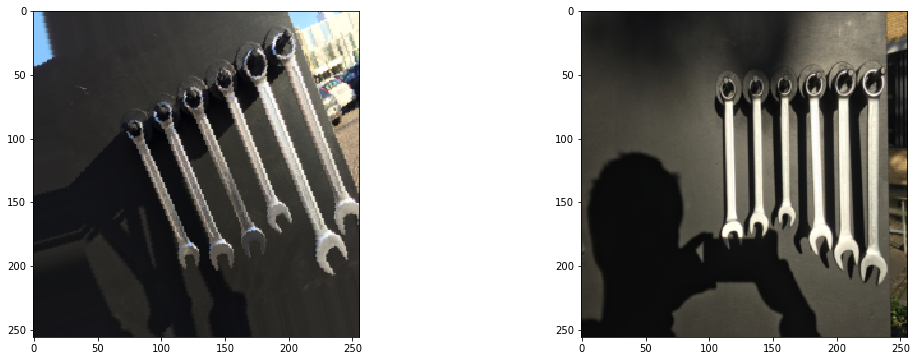

In [292]:
plt.rcParams['figure.figsize'] = (18, 6)

img1 = utils.load_img(validation_data_dir+'/pos2/16_18_19_17_24_22_L_L_L_H_H_L_0780_0_4988_0_3705.png', target_size=(256, 256))
img2 = utils.load_img(test_data_dir+'/pos1/18_17_16_19_22_24_H_L_L_H_H_L_0717_0_2209.png', target_size=(256, 256))


f, ax = plt.subplots(1, 2)
ax[0].imshow(img1)
ax[1].imshow(img2)
plt.show()

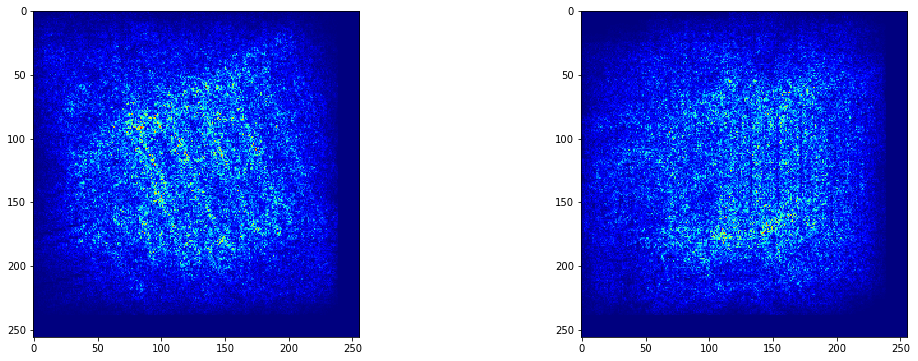

In [298]:
from vis.visualization import visualize_saliency, overlay
from vis.utils import utils
from keras import activations

# Utility to search for layer index by name. 
# Alternatively we can specify this as -1 since it corresponds to the last layer.
layer_idx = utils.find_layer_idx(model, 'activation_15')

f, ax = plt.subplots(1, 2)
for i, img in enumerate([img1, img2]):    
    # 20 is the imagenet index corresponding to `ouzel`
    grads = visualize_saliency(model, layer_idx, filter_indices=0, seed_input=img)
    
    # visualize grads as heatmap
    ax[i].imshow(grads, cmap='jet')
plt.show()

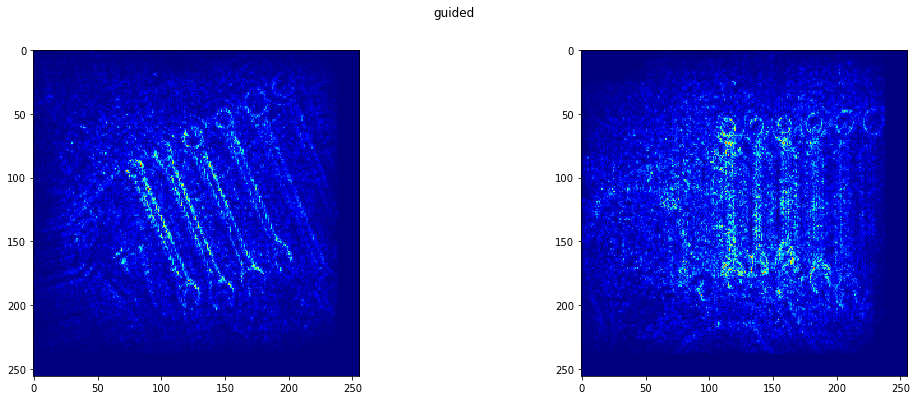

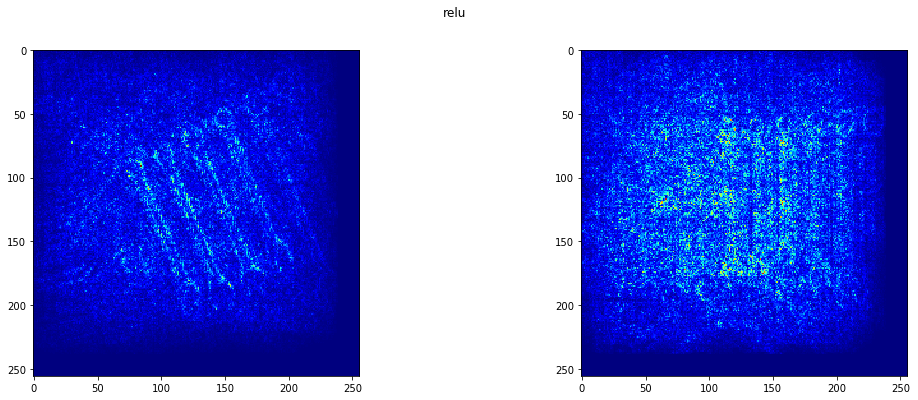

In [300]:
for modifier in ['guided', 'relu']:
    plt.figure()
    f, ax = plt.subplots(1, 2)
    plt.suptitle(modifier)
    for i, img in enumerate([img1, img2]):    
        # 20 is the imagenet index corresponding to `ouzel`
        grads = visualize_saliency(model, layer_idx, filter_indices=[0], 
                                   seed_input=img, backprop_modifier=modifier)
        # Lets overlay the heatmap onto original image.    
        ax[i].imshow(grads, cmap='jet')
plt.show()

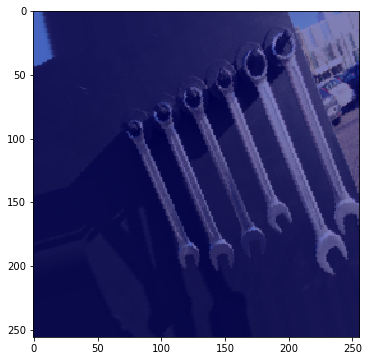

In [306]:
import numpy as np
import matplotlib.cm as cm
from vis.visualization import visualize_cam

#for modifier in [None, 'guided', 'relu']:
plt.figure()
#f, ax = plt.subplots(1, 2)
#plt.suptitle("vanilla" if modifier is None else modifier)
#for i, img in enumerate([img1, img2]):    
    # 20 is the imagenet index corresponding to `ouzel`
grads = visualize_cam(model, layer_idx, filter_indices=[1], 
                      seed_input=img1, backprop_modifier='guided')        
    # Lets overlay the heatmap onto original image.    
    #jet_heatmap = np.uint8(cm.jet(grads)[..., :3] * 256)
#jet_heatmap = np.uint8(cm.jet(grads)[:,:,:,:3]*256)
plt.imshow(grads, cmap='jet')

plt.imshow(overlay(grads, img1))
plt.show()

In [289]:
np.shape(jet_heatmap)

(256, 256, 3, 3)

# Test data validation

In [211]:
test_data_dir = '../data/model/key18/test'
nb_test_samples = int(len(glob.glob(test_data_dir+'/*/*.png')))


test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(img_width, img_height),
    batch_size=1,
    shuffle = False,
    class_mode='categorical')

test_pred_prob = model.predict_generator(test_generator,steps = 150 // 1, verbose=1)
test_pred_labels = np.argmax(test_pred_prob, axis=-1)

Found 150 images belonging to 6 classes.
143/150 [===========================>..] - ETA: 0s

In [212]:
acc = 1-np.sum(test_pred_labels!=test_generator.classes)/nb_test_samples
acc

0.51333333333333331

In [213]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

pos1\18_22_17_19_16_24_L_H_H_H_H_H_120_0_5837.png


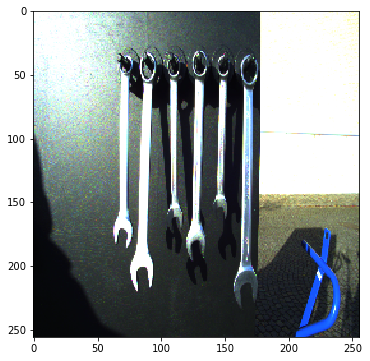

pos1\18_22_17_19_16_24_L_H_H_H_H_H_123_0_9678.png


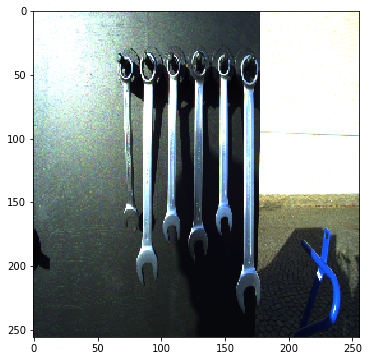

pos1\18_22_17_19_16_24_L_H_H_H_H_H_124_0_8722.png


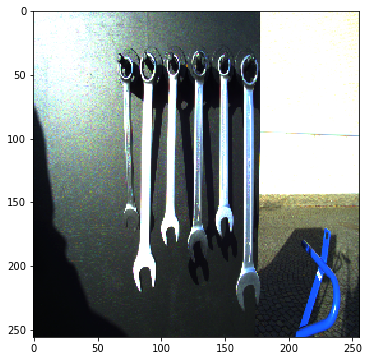

pos3\16_24_18_17_22_19_L_H_H_H_L_L_0_3431.png


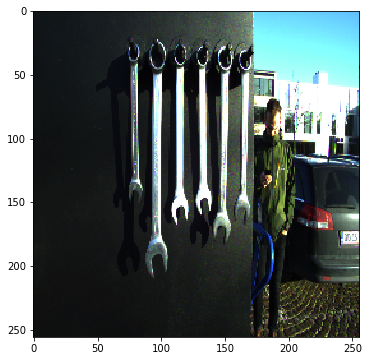

pos3\16_24_18_19_22_17_L_H_H_L_L_H_0_4004.png


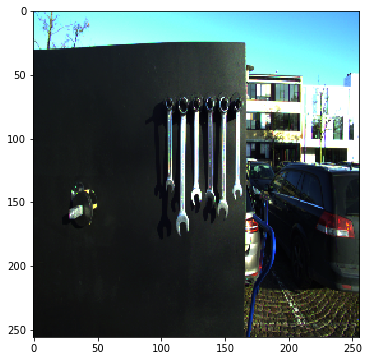

pos3\17_16_18_19_22_24_H_H_L_H_H_H_103_0_6587.png


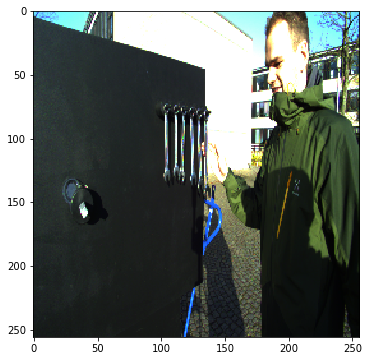

pos3\17_16_18_19_22_24_H_H_L_H_H_H_104_0_9377.png


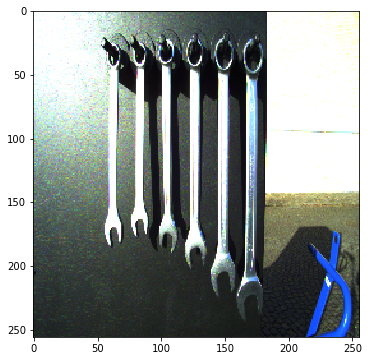

pos3\17_16_18_19_22_24_H_H_L_H_H_H_105_0_360.png


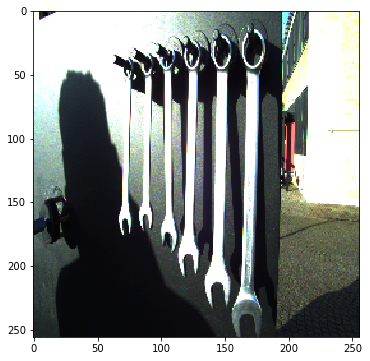

pos3\17_16_18_19_22_24_H_H_L_H_H_H_106_0_1496.png


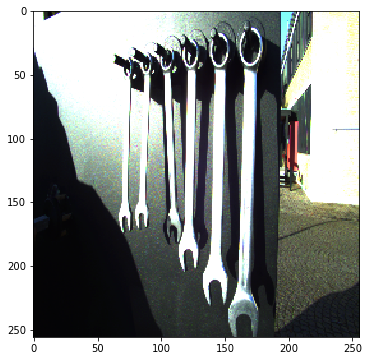

pos3\17_16_18_19_22_24_H_H_L_H_H_H_107_0_5410.png


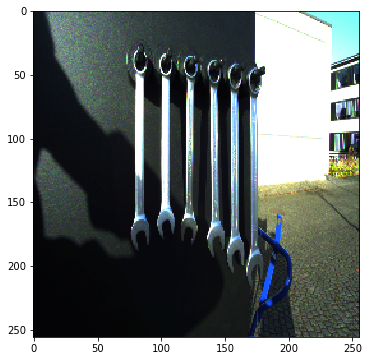

pos3\17_16_18_19_22_24_H_H_L_H_H_H_108_0_9241.png


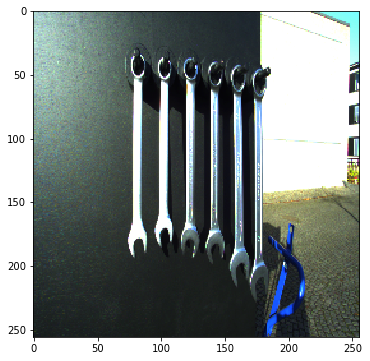

pos3\17_16_18_19_22_24_H_H_L_H_H_H_109_0_7086.png


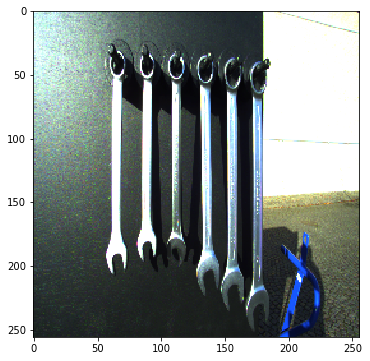

pos3\17_22_18_19_16_24_H_H_L_H_H_H_110_0_7817.png


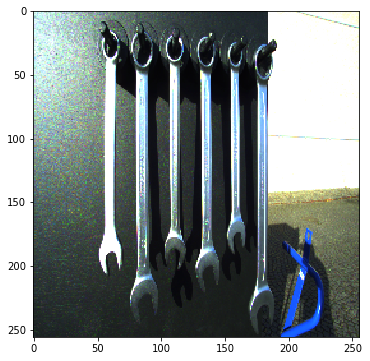

pos3\17_22_18_19_16_24_H_H_L_H_H_H_111_0_1469.png


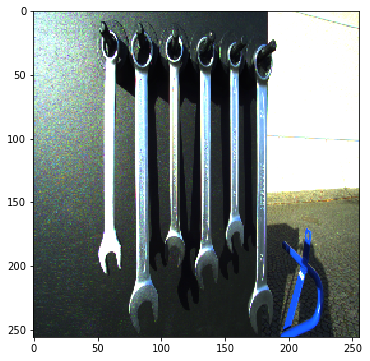

pos3\17_22_18_19_16_24_H_H_L_H_H_H_112_0_976.png


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


pos3\17_22_18_19_16_24_H_H_L_H_H_H_118_0_639.png


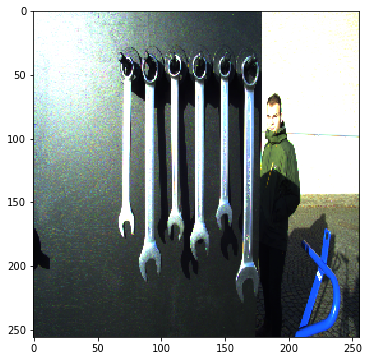

pos3\24_16_18_19_22_17_H_L_H_L_L_H_27_0_6094.png


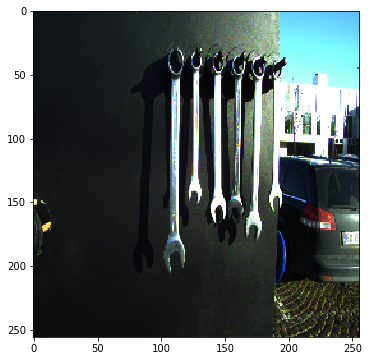

pos3\24_16_18_19_22_17_H_L_H_L_L_H_28_0_1568.png


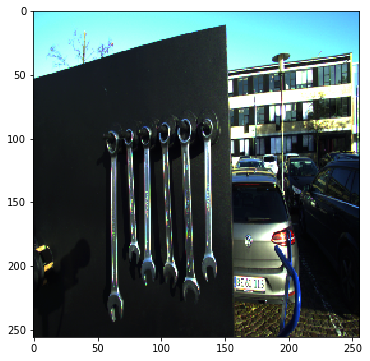

pos3\24_16_18_19_22_17_H_L_H_L_L_H_29_0_4400.png


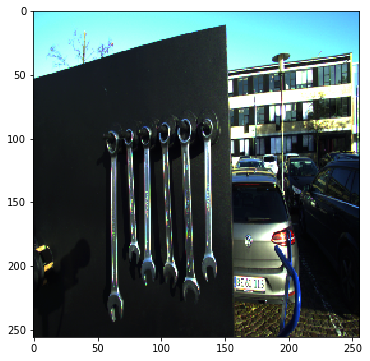

pos3\24_16_18_19_22_17_H_L_H_L_L_H_30_0_9716.png


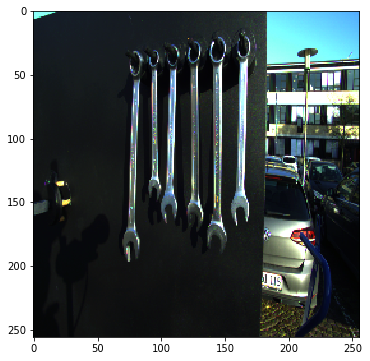

pos3\24_16_18_19_22_17_H_L_H_L_L_H_31_0_8435.png


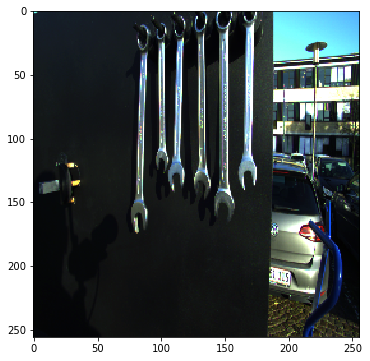

pos3\24_16_18_19_22_17_H_L_H_L_L_H_32_0_4865.png


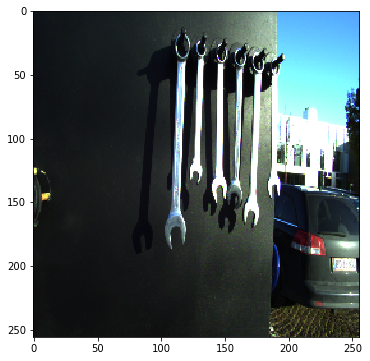

pos4\17_16_22_18_19_24_H_L_L_H_L_L_0701_0_6297.png


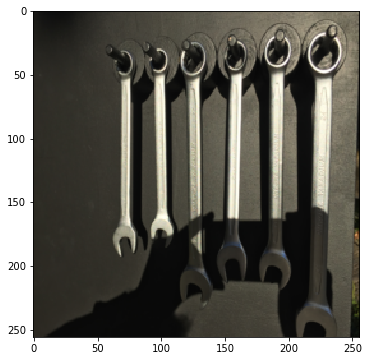

pos4\22_16_24_18_17_19_H_L_H_H_H_L_131_0_1051.png


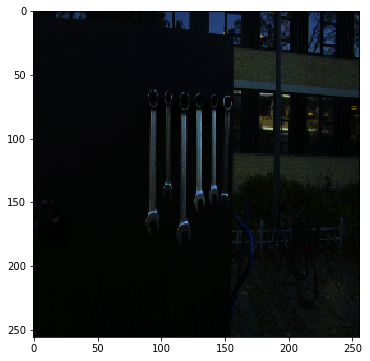

pos4\22_16_24_18_17_19_H_L_H_H_H_L_132_0_102.png


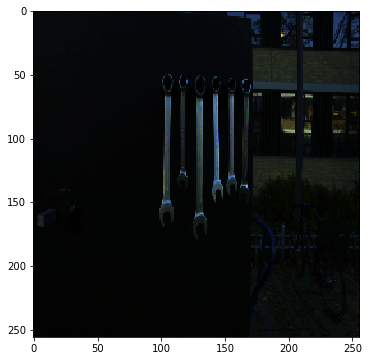

pos4\22_16_24_18_17_19_H_L_H_H_H_L_137_0_5834.png


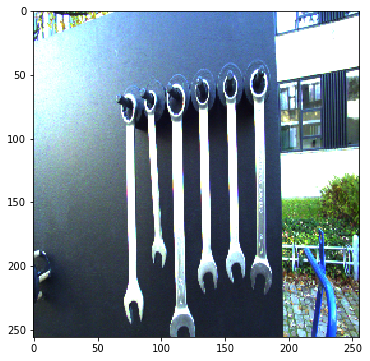

pos5\16_19_22_17_18_24_L_L_L_H_H_H_57_0_3240.png


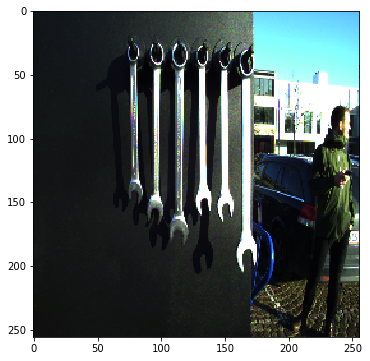

pos5\16_19_22_17_18_24_L_L_L_H_H_H_58_0_6871.png


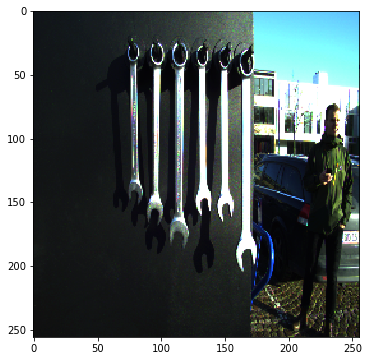

pos5\16_19_22_17_18_24_L_L_L_H_H_H_59_0_1557.png


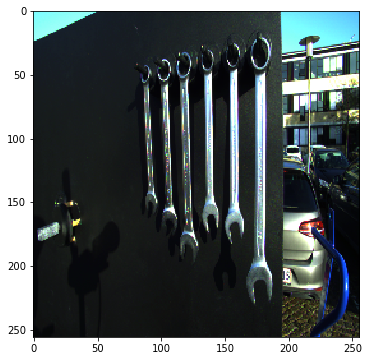

pos5\16_19_22_17_18_24_L_L_L_H_H_H_60_0_2253.png


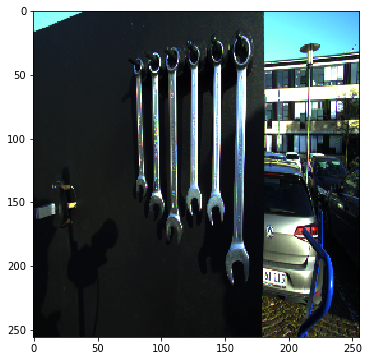

pos5\16_19_22_17_18_24_L_L_L_H_H_H_61_0_3879.png


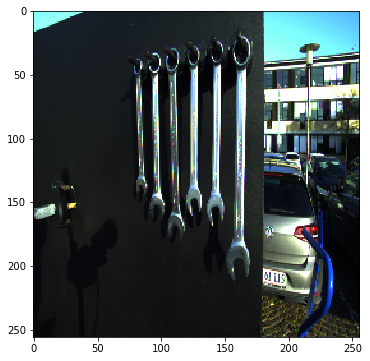

pos5\16_19_22_17_18_24_L_L_L_H_H_H_62_0_4565.png


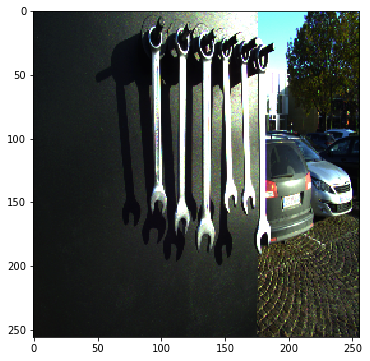

pos5\16_19_22_17_18_24_L_L_L_H_H_H_63_0_7997.png


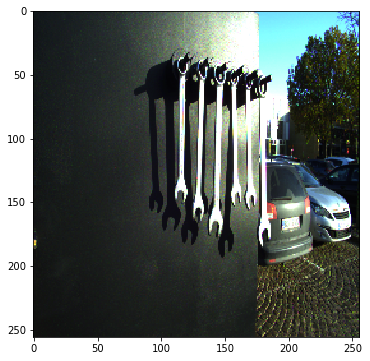

pos5\16_19_22_17_18_24_L_L_L_H_H_H_64_0_3150.png


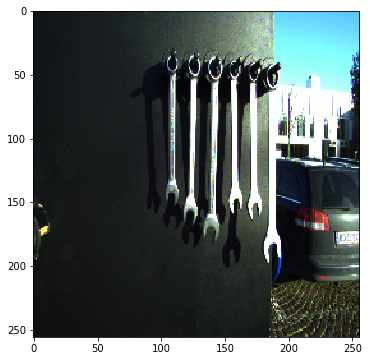

pos5\16_19_22_17_18_24_L_L_L_H_H_H_65_0_8753.png


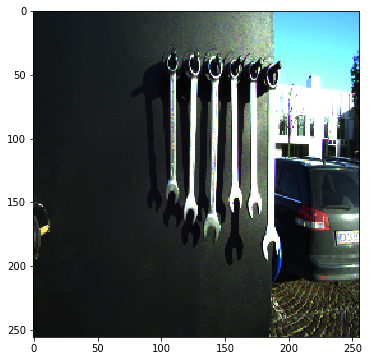

pos5\16_19_22_17_18_24_L_L_L_H_H_H_66_0_7591.png


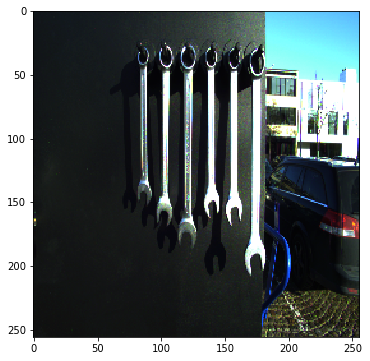

pos5\16_19_22_17_18_24_L_L_L_H_H_H_67_0_9568.png


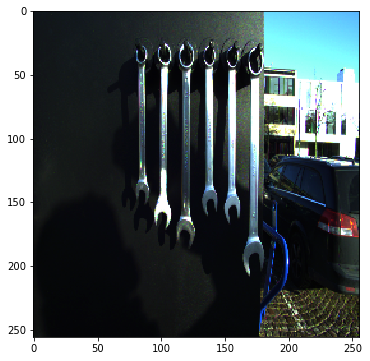

pos5\16_19_22_17_18_24_L_L_L_H_H_H_68_0_5614.png


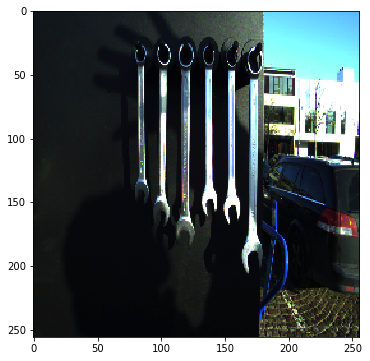

pos5\16_19_22_17_18_24_L_L_L_H_H_H_69_0_3363.png


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


pos5\16_24_22_17_18_19_L_H_L_H_H_L_53_0_7921.png


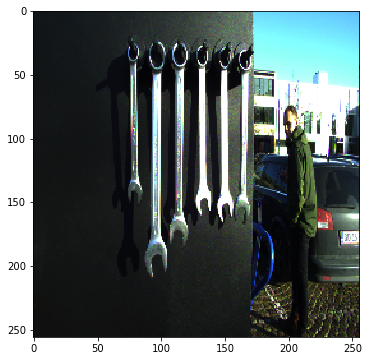

pos5\16_24_22_17_18_19_L_H_L_H_H_L_54_0_9458.png


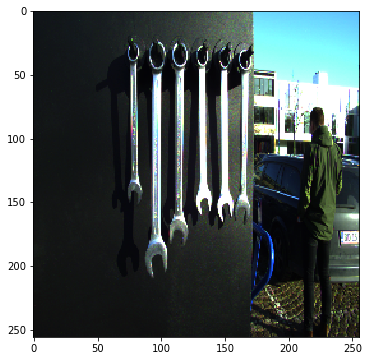

pos5\17_19_22_16_18_24_H_L_L_L_H_H_70_0_6324.png


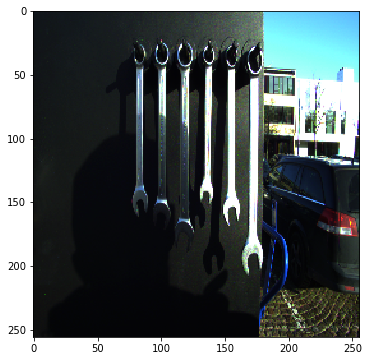

pos5\17_19_22_16_18_24_H_L_L_L_H_H_72_0_8369.png


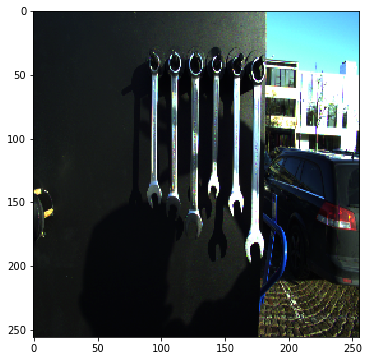

pos5\17_19_22_16_18_24_H_L_L_L_H_H_74_0_8372.png


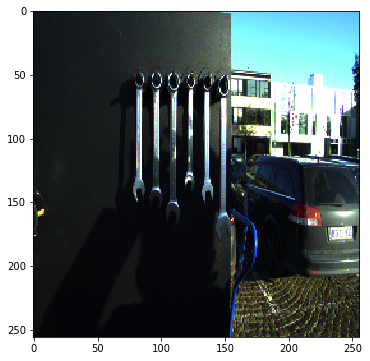

pos5\17_19_22_16_18_24_H_L_L_L_H_H_75_0_9817.png


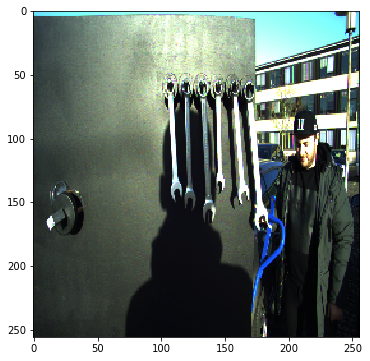

pos5\17_19_22_16_18_24_H_L_L_L_H_H_76_0_2286.png


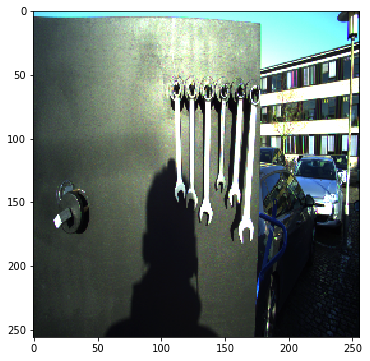

pos5\17_19_22_16_18_24_H_L_L_L_H_H_77_0_649.png


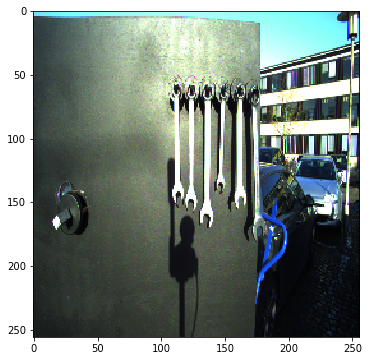

pos5\17_19_22_16_18_24_H_L_L_L_H_H_78_0_2134.png


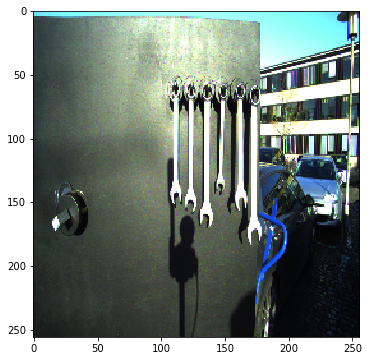

pos5\17_19_22_16_18_24_H_L_L_L_H_H_79_0_6038.png


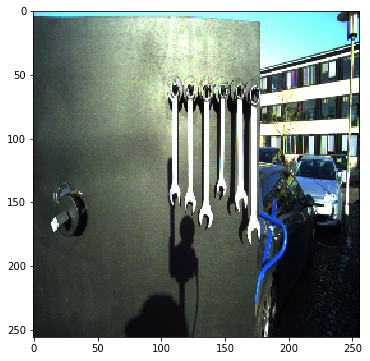

pos5\17_24_16_22_18_19_H_H_L_L_H_L_100_0_5361.png


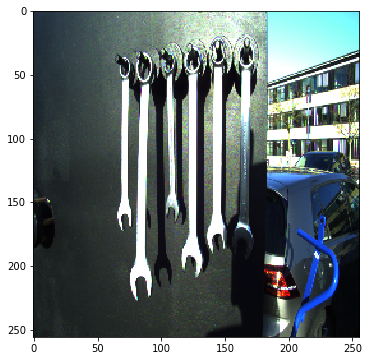

pos5\17_24_16_22_18_19_H_H_L_L_H_L_102_0_7752.png


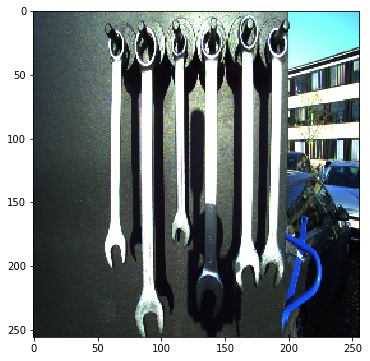

pos5\17_24_16_22_18_19_H_H_L_L_H_L_93_0_1967.png


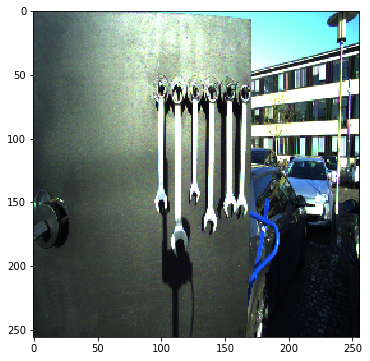

pos5\17_24_16_22_18_19_H_H_L_L_H_L_94_0_5261.png


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


pos5\17_24_22_16_18_19_H_H_L_L_H_L_84_0_1334.png


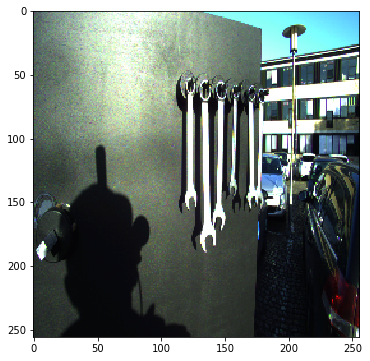

pos5\17_24_22_16_18_19_H_H_L_L_H_L_85_0_7272.png


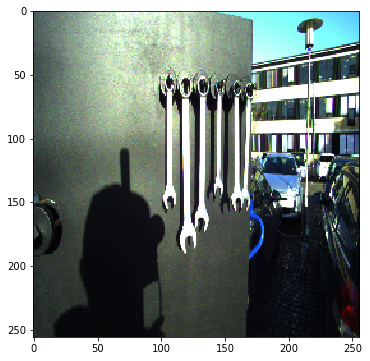

pos5\17_24_22_16_18_19_H_H_L_L_H_L_86_0_1228.png


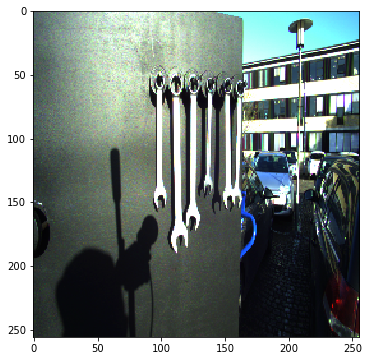

pos5\17_24_22_16_18_19_H_H_L_L_H_L_87_0_3365.png


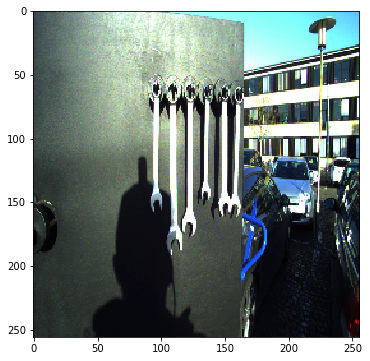

pos5\17_24_22_16_18_19_H_H_L_L_H_L_88_0_3219.png


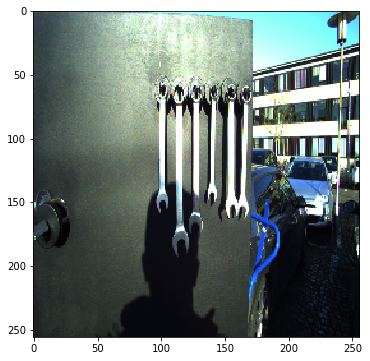

pos5\17_24_22_16_18_19_H_H_L_L_H_L_89_0_3535.png


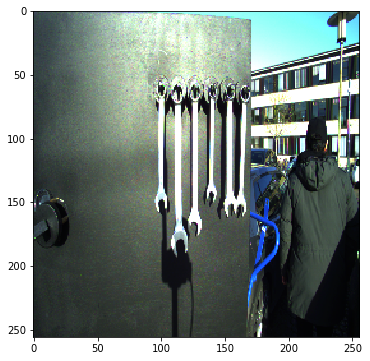

pos5\17_24_22_16_18_19_H_H_L_L_H_L_90_0_7784.png


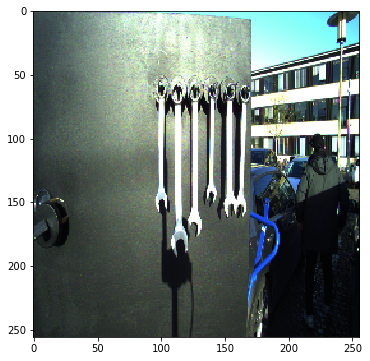

pos5\17_24_22_16_18_19_H_H_L_L_H_L_91_0_1607.png


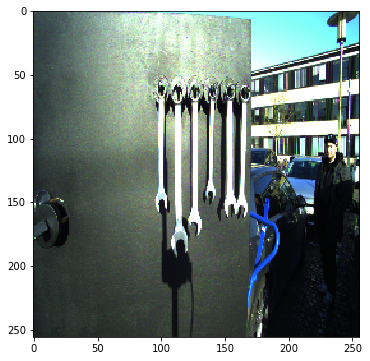

pos5\17_24_22_16_18_19_H_H_L_L_H_L_92_0_1778.png


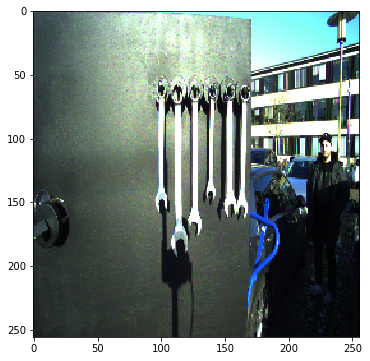

pos5\22_17_24_16_18_19_L_H_H_L_H_L_0590_0_1917.png


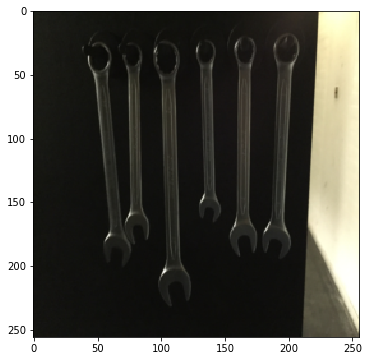

In [214]:
idx = np.array(np.where(test_pred_labels!=test_generator.classes))
for i in range(0,idx.shape[1]):
    print(test_generator.filenames[idx[0,i]])
    imgs=mpimg.imread(test_data_dir+'/'+test_generator.filenames[idx[0,i]])
    plt.figure()
    imgplot = plt.imshow(imgs)
    plt.show()